***
# Importes
***

In [200]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
import statsmodels.api as sm
import imblearn
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
import sys
from sklearn.linear_model import LinearRegression
!pip install mlxtend
import joblib
sys.modules['sklearn.externals.joblib'] = joblib
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
import matplotlib.patches as mpatches
import plotly.express as px
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from seaborn import distplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


***
# Abstract
***

Las enfermedades y los problemas del corazón afectan a una gran parte de la sociedad. Nos afectan a nosotros, ya sea de forma directa o a nuestros familiares y amigos. Un accidente cerebrovascular puede causar ocasionalmente discapacidades temporales o permanentes, según el tiempo que el cerebro permanezca sin flujo sanguíneo y la parte afectada.
Muchas estrategias de prevención de accidentes cerebrovasculares son las mismas que las estrategias de prevención de enfermedades cardíacas. Controlar la presión arterial alta, reducir la cantidad de colesterol y grasas saturadas en tu alimentación, hacer ejercicio de forma regular, evitar el alcohol y el tabaquismo entre otras recomendaciones para mantener un estilo de vida saludable.
Es escencial la detección temprana de los distintos signos de advertencia para evitar o minimizar un accidente cerebrovascular. Se busca detectar en un estadío temprano cualquier tipo de enfermedad por accidente cerebrovascular a través del uso de un modelo creado a partir de una base de datos de miles de personas con múltiples características para cada una. Este dataset pertenece al BRFSS 2015 (Behavioral Risk Factor Surveillance System).

***
# Objetivo
***

¿Cómo podemos prevenir la ocurrencia de un accidente cerebrovascular?

¿Podemos detectar patrones entre distintas poblaciones con distintas caracterisicas en la ocurrencia de un accidentes cerebrovasculares?

***
# Hipótesis
***

Se planteron las siguientes preguntas:

1.   ¿Que factores están mayormente relacionados con la ocurrencia de un accidente cardiovascular? 

2.   ¿Puede la existencia de ataques al corazón llevar a una persona a sufrir de un accidente cerebrovascular?



***
# Contexto Comercial
***

Según la Organización Mundial de la Salud (OMS), el accidente cerebrovascular es la 2ª causa principal de muerte a nivel mundial, responsable de aproximadamente el 11% del total de muertes. Más de 877,500 estadounidenses mueren de enfermedades cardíacas, accidentes cerebrovasculares y otras enfermedades cardiovasculares cada año. La OMS nos ha contratado para descubrir cuales son las principales fuentes de estos accidentes con el objetivo de implementar cambios en la sociedad y asi reducir su ocurrencia a lo largo de los años.

***
# Contexto analítico
***

Mediante la manipulación de los datos disponibles y las visualizaciones se buscará responder a:
*   ¿Cómo la presencia de hábitos saludables y de una alimentacion adecuada afectan a la ocurrencia de accidentes cerebrovasculares?
*   ¿Cómo afecta el género en la ocurrencia de accidentes cerebrovascucares?
*   Luego de presentar un accidente cerebrovascular, ¿se presentan problemas en el corazón?

***
# Diccionario de variables
***

Explicación sobre las variables que se utilizaron a lo largo de este trabajo.

*   HeartDiseaseorAttack: Ataque al corazón o enfermedad al corazón. 1 significa que la persona presenta problemas o sufrió de una ataque al corazón. Variable binaria.

*   HighBP: Alta presión sanguínea. 1 significa que la persona ha sido indicada por un profesional de la salud que presenta una presión sanguínea elevada. Variable binaria.

*   HighChol: Alto colesterol. 1 significa que la persona ha sido indicada por un profesional de la salud que presenta alto colesterol. Variable binaria.

*   CholCheck: Control de colesterol. 1 significa que la persona se a hecho un control de colesterol. Variable binaria.

*   BMI: Índice de masa corporal (IMC). Variable entera entre 0 y 100.

*   Smoker: Fumador. 1 Significa que la persona ha fumado al menos 100 cigarrillos en su vida. Variable binaria.

*   Stroke: Accidente cerebrovascular. 1 significa que a la persona le han dicho que sufrió de un accidente cerebrovascular. Variable binaria.

*   Diabetes: Diabetes. 1 significa que a la persona le han dicho que sufrió de diabetes. Variable binaria.

*   Physical Activity: Actividad física. 1 si la persona reportó haber hecho ejercicio en los ultimos 30 dias. Variable binaria.

*   Fruits: Frutas. 1 si la persona consume 1 o mas frutas por dia. Variable binaria.

*   Vegetables: Verduras. 1 si la persona consume 1 o mas verduras por dia. Variable binaria.

*   HvyAlcoholConsump: Consumo excesivo de alcohol. 1 si la persona adulta: es hombre y consumió mas de 14 vasos de alcohol en la semana o si es mujer y consumió mas de 7 vasos de alcohol en la semana. Variable binaria.

*   AnyHealthcare: Seguro social. 1 si la persona tiene algun tipo de plan de salud, ya sea seguro social, plan prepago o plan de seguro gubernamental. Variable binaria.

*   NoDocbcCost: No le fue posible atenderse con un doctor por falta de dinero. 1 si la persona se quizo atender con un doctor y no pudo por falta de dinero. Variable binaria.

*   GenHlth: 5 diferentes categorías que indican el estado de salud general.
    1.   Excelente
    2.   Muy bueno
    3.   Bueno
    4.   Aceptable
    5.   Malo

*   MentHlth: Salud mental. Pensando sobre salud mental, la cual incluye estrés, depresión y problemas con tus emociones. ¿por cuantos días durante los últimos 30 días tu salud mental no ha sido buena? Variable entera entre 0 y 30.

*   PhysHlth: Salud física. Pensando en tu salud física, la cual incluye enfermedades y lesiones físicas, ¿por cuántos días durante los últimos 30 días tu salud física no ha sido buena? Variable entera entre 0 y 30.

*   DiffWalk: Dificultad para caminar. 1 si la persona tiene problemas para caminar o subir escaleras. Variable binaria

*   Sex: Indica el sexo de la persona. 0 si la persona es mujer y si la persona es hombre. Variable binaria.

*   Age: 14 diferentes categorías que indican la edad.
    1.   18 <= Edad <= 24
    2.   25 <= Edad <= 29
    3.   30 <= Edad <= 34
    4.   35 <= Edad <= 39
    5.   40 <= Edad <= 44
    6.   45 <= Edad <= 49
    7.   50 <= Edad <= 54
    8.   55 <= Edad <= 59
    9.   60 <= Edad <= 64
    10.  65 <= Edad <= 69
    11.  70 <= Edad <= 74
    12.  75 <= Edad <= 79
    13.  80 <= Edad <= 99

*   Education: 6 diferentes categorías que indican la educación. Indica el mayor de nivel de educación completado.
    1.   Solo atendió al jardin de infantes/preescolar
    2.   Grados entre 1-8. Educación elemental
    3.   Grados entre 9-11. Educación superior/secundaria en curso
    4.   Grados 12. Educación superior/secundaria completa
    5.   Universidad 1-3 años. Tecnicatura completa o universidad en curso
    6.   Universidad 4 años o más. Universidad completa

*   Income: 8 diferentes categorías que indican los ingresos anuales en dólares por persona.
    1.   Ingresos <= $10000
    2.   $10000 < Ingresos <= $15000
    3.   $15000 < Ingresos <= $20000
    4.   $20000 < Ingresos <= $25000
    5.   $25000 < Ingresos <= $35000
    6.   $35000 < Ingresos <= $50000
    7.   $50000 < Ingresos <= $75000
    8.   $75000 < Ingresos

***
# Limpieza de datos
***

In [201]:
url = 'https://raw.githubusercontent.com/Tomtechno/DataScience-Coder/main/heart_disease_health_indicators_BRFSS2015.csv?token=GHSAT0AAAAAABZIXNY35I43NJ2BCJG2S7EYY25QKGQ'
df = pd.read_csv(url)
df.head()

,HeartDiseaseorAttack,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,Diabetes,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0


Se cargó el dataset utilizando github

In [202]:
df.describe()

,HeartDiseaseorAttack,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,Diabetes,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,...,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000
mean,0.094186,0.429001,0.424121,0.962670,28.382364,0.443169,0.040571,0.296921,0.756544,0.634256,...,0.951053,0.084177,2.511392,3.184772,4.242081,0.168224,0.440342,8.032119,5.050434,6.053875
std,0.292087,0.494934,0.494210,0.189571,6.608694,0.496761,0.197294,0.698160,0.429169,0.481639,...,0.215759,0.277654,1.068477,7.412847,8.717951,0.374066,0.496429,3.054220,0.985774,2.071148
min,0.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,6.000000,4.000000,5.000000
50%,0.000000,0.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,7.000000
75%,0.000000,1.000000,1.000000,1.000000,31.000000,1.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,3.000000,2.000000,3.000000,0.000000,1.000000,10.000000,6.000000,8.000000
max,1.000000,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,2.000000,1.000000,1.000000,...,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000


Se obtuvieron algunos datos interesantes como los máximos, mínimos, cuartiles y medias para todas las características.

In [203]:
df.isnull().any()

HeartDiseaseorAttack    False
HighBP                  False
HighChol                False
CholCheck               False
BMI                     False
Smoker                  False
Stroke                  False
Diabetes                False
PhysActivity            False
Fruits                  False
Veggies                 False
HvyAlcoholConsump       False
AnyHealthcare           False
NoDocbcCost             False
GenHlth                 False
MentHlth                False
PhysHlth                False
DiffWalk                False
Sex                     False
Age                     False
Education               False
Income                  False
dtype: bool

Se buscó la aparición de algun dato nulo en el dataset. No se encontró ninguno.

In [204]:
df.columns

Index(['HeartDiseaseorAttack', 'HighBP', 'HighChol', 'CholCheck', 'BMI',
       'Smoker', 'Stroke', 'Diabetes', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

In [205]:
with pd.option_context("display.max_columns", None):display(df)

,HeartDiseaseorAttack,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,Diabetes,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,0.0,1.0,1.0,1.0,45.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,5.0,0.0,1.0,5.0,6.0,7.0
253676,0.0,1.0,1.0,1.0,18.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,0.0,0.0,1.0,0.0,11.0,2.0,4.0
253677,0.0,0.0,0.0,1.0,28.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,5.0,2.0
253678,0.0,1.0,0.0,1.0,23.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,1.0,7.0,5.0,1.0


In [206]:
df.isna().sum()

HeartDiseaseorAttack    0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
Diabetes                0
PhysActivity            0
Fruits                  0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64

Se verificó que no haya datos faltantes. Todo resultó correcto.

In [207]:
print(df[df.Age>100])
print(df[df.Age<0])

Empty DataFrame
Columns: [HeartDiseaseorAttack, HighBP, HighChol, CholCheck, BMI, Smoker, Stroke, Diabetes, PhysActivity, Fruits, Veggies, HvyAlcoholConsump, AnyHealthcare, NoDocbcCost, GenHlth, MentHlth, PhysHlth, DiffWalk, Sex, Age, Education, Income]
Index: []

[0 rows x 22 columns]
Empty DataFrame
Columns: [HeartDiseaseorAttack, HighBP, HighChol, CholCheck, BMI, Smoker, Stroke, Diabetes, PhysActivity, Fruits, Veggies, HvyAlcoholConsump, AnyHealthcare, NoDocbcCost, GenHlth, MentHlth, PhysHlth, DiffWalk, Sex, Age, Education, Income]
Index: []

[0 rows x 22 columns]


Se analizó la ocurrencia de algun valor anómalo para la variable edad. No se encontró ninguno.

In [208]:
df.rename(columns={"HeartDiseaseorAttack": "target", "HighBP": "AltaPresionSanguinea", "HighChol": "AltoColesterol", "CholCheck": "Colesterol",
                   "Smoker": "Fumador", "Stroke": "AccidenteCerebrovascular", "PhysActivity": "ActivFisica",
                   "Fruits": "ConsumoFrutas", "Veggies":"ConsumoVerduras", "HvyAlcoholConsump": "AltoConsumoAlcohol",
                   "AnyHealthcare": "ObraSocial", "NoDocbcCost": "SinDoctorCostoso", "GenHlth": "SaludGnrl", "DiffWalk": "DificCaminar",
                   "Sex": "Genero", "Education": "Educacion", "Income": "IngresoMonetario", "Age": "Edad", "BMI": "IMC",
                   "MentHlth": "SaludMental", "PhysHlth": "SaludFisica"}, inplace=True)
listaCaract = ['target', 'AltaPresionSanguinea', 'AltoColesterol', 'Colesterol',
       'Fumador', 'AccidenteCerebrovascular', 'Diabetes', 'ActivFisica', 'ConsumoFrutas', 'ConsumoVerduras',
       'AltoConsumoAlcohol', 'ObraSocial', 'SinDoctorCostoso', 'DificCaminar', 'Genero', 'Educacion',
       'IngresoMonetario','Edad']

Se renombró a las variables con nombres mas claros, significativos y en español.

In [209]:
# Se creó un dataset con los casos positivos de ataques al corazón
df_positivos = df[df['target'] == 1] 
df_positivos

,target,AltaPresionSanguinea,AltoColesterol,Colesterol,IMC,Fumador,AccidenteCerebrovascular,Diabetes,ActivFisica,ConsumoFrutas,...,ObraSocial,SinDoctorCostoso,SaludGnrl,SaludMental,SaludFisica,DificCaminar,Genero,Edad,Educacion,IngresoMonetario
8,1.0,1.0,1.0,1.0,30.0,1.0,0.0,2.0,0.0,1.0,...,1.0,0.0,5.0,30.0,30.0,1.0,0.0,9.0,5.0,1.0
20,1.0,1.0,1.0,1.0,22.0,0.0,1.0,0.0,0.0,1.0,...,1.0,0.0,3.0,30.0,0.0,1.0,0.0,12.0,4.0,4.0
26,1.0,1.0,1.0,1.0,37.0,1.0,1.0,2.0,0.0,0.0,...,1.0,0.0,5.0,0.0,0.0,1.0,1.0,10.0,6.0,5.0
27,1.0,1.0,1.0,1.0,28.0,1.0,0.0,2.0,0.0,0.0,...,1.0,0.0,4.0,0.0,0.0,0.0,1.0,12.0,2.0,4.0
47,1.0,1.0,1.0,1.0,25.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,2.0,1.0,0.0,0.0,1.0,10.0,4.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253668,1.0,0.0,1.0,1.0,29.0,1.0,0.0,2.0,0.0,1.0,...,1.0,0.0,2.0,0.0,0.0,1.0,1.0,10.0,3.0,6.0
253670,1.0,1.0,1.0,1.0,25.0,0.0,0.0,2.0,0.0,1.0,...,1.0,0.0,5.0,15.0,0.0,1.0,0.0,13.0,6.0,4.0
253671,1.0,1.0,1.0,1.0,23.0,0.0,1.0,0.0,0.0,0.0,...,1.0,1.0,4.0,0.0,5.0,0.0,1.0,8.0,3.0,2.0
253672,1.0,1.0,0.0,1.0,30.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,12.0,2.0,1.0


In [210]:
# Se creó un dataset con los casos negativos de ataques al corazón
df_negativos = df[df['target'] == 0] 
df_negativos

,target,AltaPresionSanguinea,AltoColesterol,Colesterol,IMC,Fumador,AccidenteCerebrovascular,Diabetes,ActivFisica,ConsumoFrutas,...,ObraSocial,SinDoctorCostoso,SaludGnrl,SaludMental,SaludFisica,DificCaminar,Genero,Edad,Educacion,IngresoMonetario
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253674,0.0,0.0,0.0,1.0,27.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0,6.0,5.0
253675,0.0,1.0,1.0,1.0,45.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,5.0,0.0,1.0,5.0,6.0,7.0
253676,0.0,1.0,1.0,1.0,18.0,0.0,0.0,2.0,0.0,0.0,...,1.0,0.0,4.0,0.0,0.0,1.0,0.0,11.0,2.0,4.0
253677,0.0,0.0,0.0,1.0,28.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,5.0,2.0


***
# Primera aproximación
***

<ipython-input-211-0e5eb7372a9e>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-211-0e5eb7372a9e>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




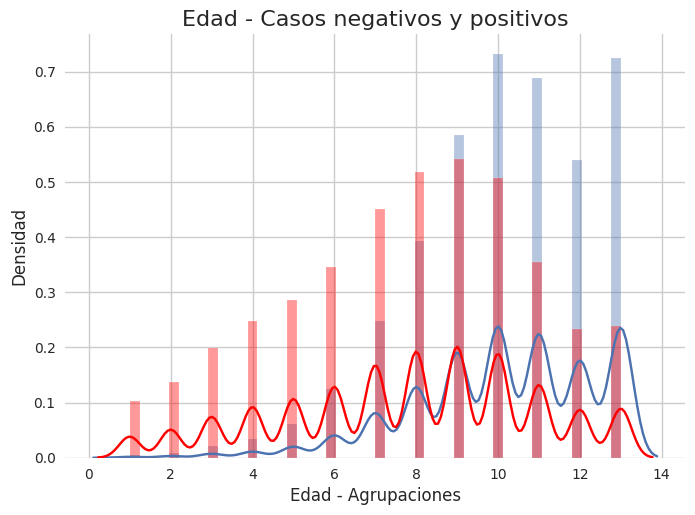

In [211]:
sns.set_style('whitegrid')
ax = distplot(df_positivos.Edad, hist=True)
ax = distplot(df_negativos.Edad, hist=True, color= "Red", label="Stroke")
ax.set_title('Edad - Casos negativos y positivos', fontsize=16)
ax.set_xlabel('Edad - Agrupaciones', fontsize=12)
ax.set_ylabel('Densidad', fontsize=12)
plt.show()

Se pudo observar que aquellas personas con presencia de ataques al corazón eran de una edad mayor a aquellas que no presentaban ningún síntoma.

<ipython-input-212-2ba37dff73b0>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-212-2ba37dff73b0>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




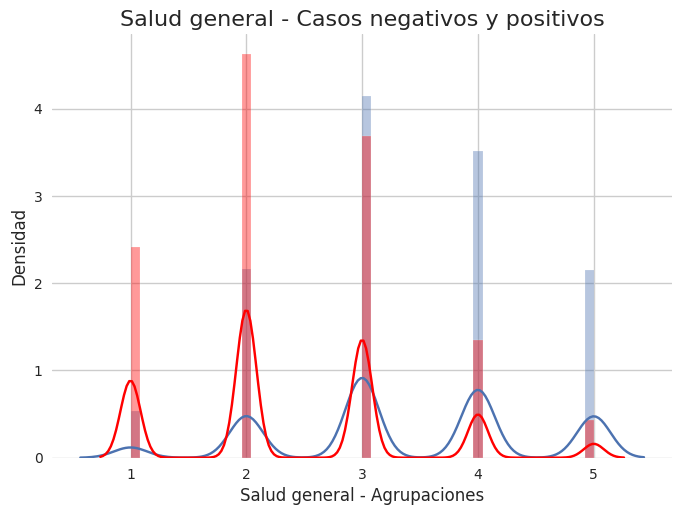

In [212]:
sns.set_style('whitegrid')
ax = distplot(df_positivos.SaludGnrl, hist=True)
ax = distplot(df_negativos.SaludGnrl, hist=True, color= "Red", label="Stroke")
ax.set_title('Salud general - Casos negativos y positivos', fontsize=16)
ax.set_xlabel('Salud general - Agrupaciones', fontsize=12)
ax.set_ylabel('Densidad', fontsize=12)
plt.show()

Se pudo observar que aquellas personas con presencia de ataques al corazón tenían un estado de salud general mejor que aquellas que no presentaban ningún síntoma.
Se ve claramente que en 1,2,3 la densidad de personas que no presentan síntomas es mayor. Por otra parte en 4,5 las personas que presentan síntomas es mayor

<ipython-input-213-399923a3c396>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-213-399923a3c396>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




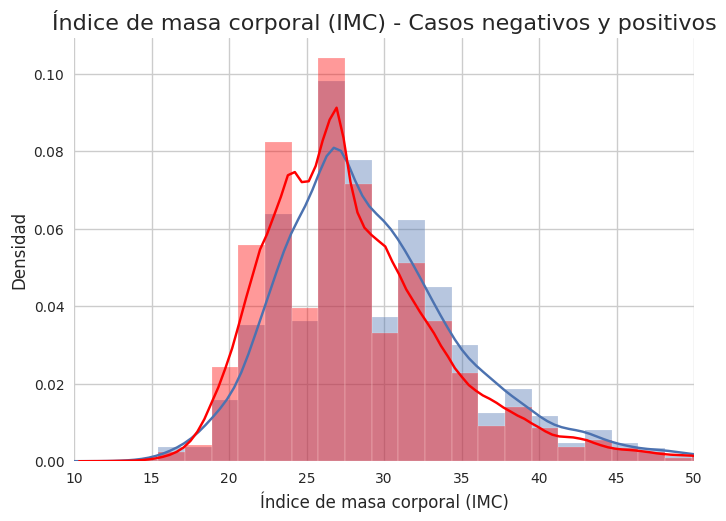

In [213]:
sns.set_style('whitegrid')
ax = distplot(df_positivos.IMC, hist=True)
ax = distplot(df_negativos.IMC, hist=True, color= "Red", label="Stroke")
ax.set_title('Índice de masa corporal (IMC) - Casos negativos y positivos', fontsize=16)
ax.set_xlabel('Índice de masa corporal (IMC)', fontsize=12)
ax.set_ylabel('Densidad', fontsize=12)
ax.set_xlim([10, 50])
plt.show()

Se pudo observar que aquellas personas con presencia de ataques al corazón tenían un IMC menor que aquellas que no presentaban ningún síntoma.

<ipython-input-214-42a486e8f794>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-214-42a486e8f794>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




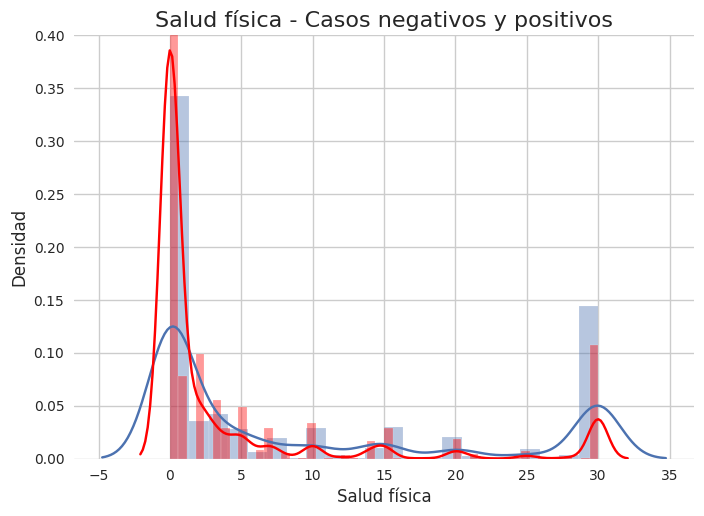

In [214]:
sns.set_style('whitegrid')
ax = distplot(df_positivos.SaludFisica, hist=True)
ax = distplot(df_negativos.SaludFisica, hist=True, color= "Red", label="Stroke")
ax.set_title('Salud física - Casos negativos y positivos', fontsize=16)
ax.set_xlabel('Salud física', fontsize=12)
ax.set_ylabel('Densidad', fontsize=12)
ax.set_ylim([0, 0.4])
plt.show()

Se pudo observar que aquellas personas con presencia de ataques al corazón tenían peor salud física que aquellas que no presentaban ningún síntoma.

***
# Primer análisis de datos
***

<ipython-input-215-9033a5d6249f>:2: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



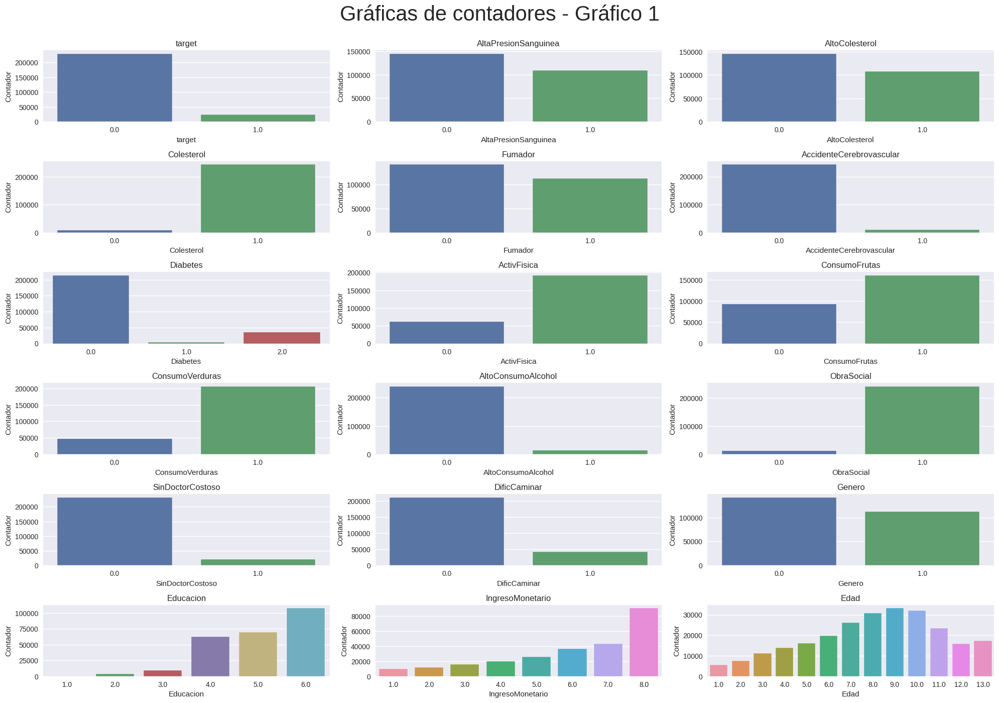

In [215]:
plt.figure(figsize=(20,40))
plt.style.use("seaborn")
plt.subplots_adjust(hspace=0.2)
color = 'winter'
for i,column in enumerate(listaCaract):
    plt.subplot(len(listaCaract), 3, i+1)
    plt.suptitle("Gráficas de contadores - Gráfico 1", fontsize=30, x=0.5, y=1)
    sns.countplot(data=df, x=column)
    plt.ylabel('Contador')
    plt.title(f"{column}")
    plt.tight_layout()

***
# Segundo análisis de datos
***

<ipython-input-216-1b03286f5d13>:5: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



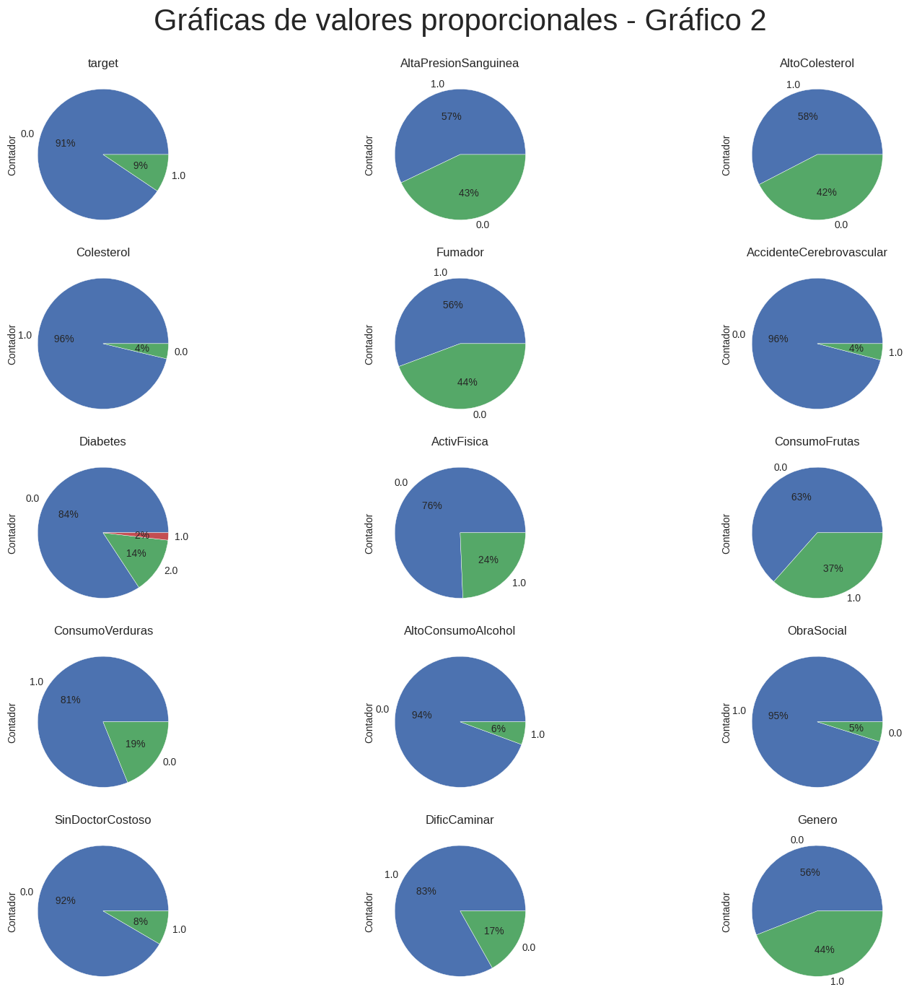

In [216]:
listaCaract2 = ['target', 'AltaPresionSanguinea', 'AltoColesterol', 'Colesterol',
       'Fumador', 'AccidenteCerebrovascular', 'Diabetes', 'ActivFisica', 'ConsumoFrutas', 'ConsumoVerduras',
       'AltoConsumoAlcohol', 'ObraSocial', 'SinDoctorCostoso', 'DificCaminar', 'Genero']
plt.figure(figsize=(15,40))
plt.style.use("seaborn")
plt.subplots_adjust(hspace=0.2)
color = 'winter'
for i,column in enumerate(listaCaract2):
    plt.subplot(len(listaCaract2), 3, i+1)
    plt.suptitle("Gráficas de valores proporcionales - Gráfico 2", fontsize=30, x=0.5, y=1)
    plt.pie(x=df[column].value_counts(), labels=df[column].unique(), autopct=' %.0f%% ')
    plt.ylabel('Contador', fontsize = 10)
    plt.title(f"{column}")
    plt.tight_layout()

Se observó en el "Grafico 2" que:

La variable target presentó mayormente ausencia de problemas en el corazón (91%).
No se vió un problema importante de accidentes cerebrovasculares (4% postivo), gran consumo de alcohol (6% positivo) o problemas al caminar (17% positivo).
Ademas, la mitad de la prueba aproximadamente presentó:

1-Alto colesterol (58%).

2-Alta presion en sangre (43%).

3-Fumadores activos (56%).

4-Sexo masculino (56%).

***
# Tercer análisis de datos
***

<ipython-input-217-de4e83660810>:2: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



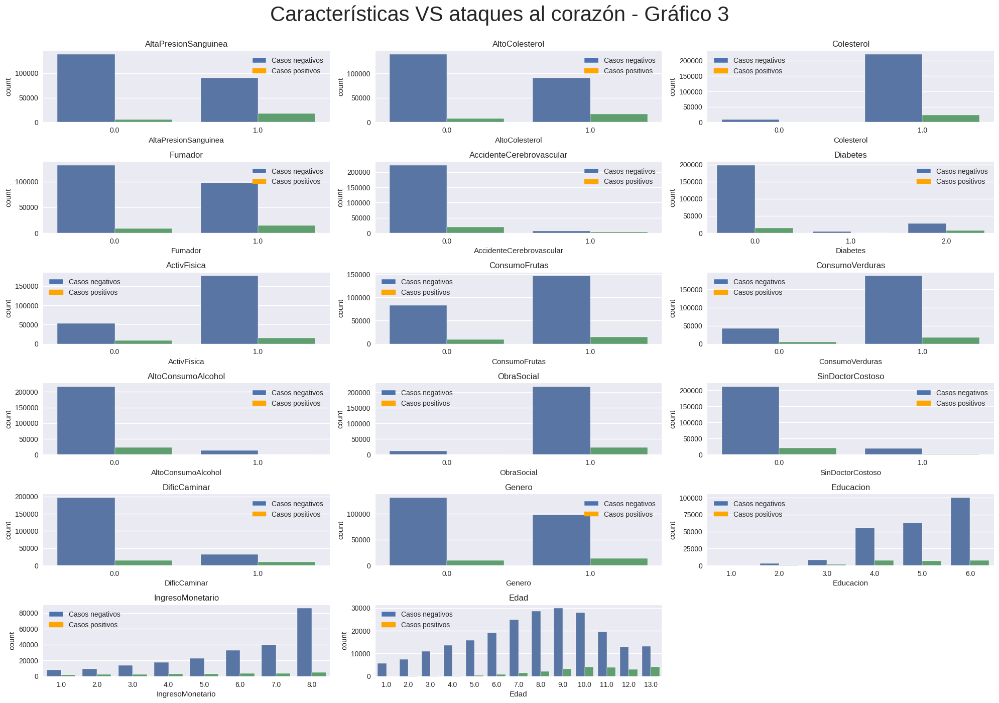

In [217]:
plt.figure(figsize=(20,40))
plt.style.use("seaborn")
plt.subplots_adjust(hspace=0.2)
color = 'winter'
for i,column in enumerate(listaCaract[1:]):
    plt.subplot(len(listaCaract), 3, i+1)
    plt.suptitle("Características VS ataques al corazón - Gráfico 3", fontsize=30, x=0.5, y=1)
    ax = sns.countplot(data=df, x=column, hue='target')
    patch_negativos = mpatches.Patch(label='Casos negativos')
    patch_positivos = mpatches.Patch(color='orange', label='Casos positivos')
    ax.legend(handles=[patch_negativos,patch_positivos])
    plt.title(f"{column}")
    plt.tight_layout()

Al enfrentar las características con el target se pudo observar una clara relación entre la actividad física y los accidentes cerebrovasculares con la presencia de problemas en el corazón.

***
# Cuarto análisis de datos
***

<ipython-input-218-87c5476acec2>:2: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



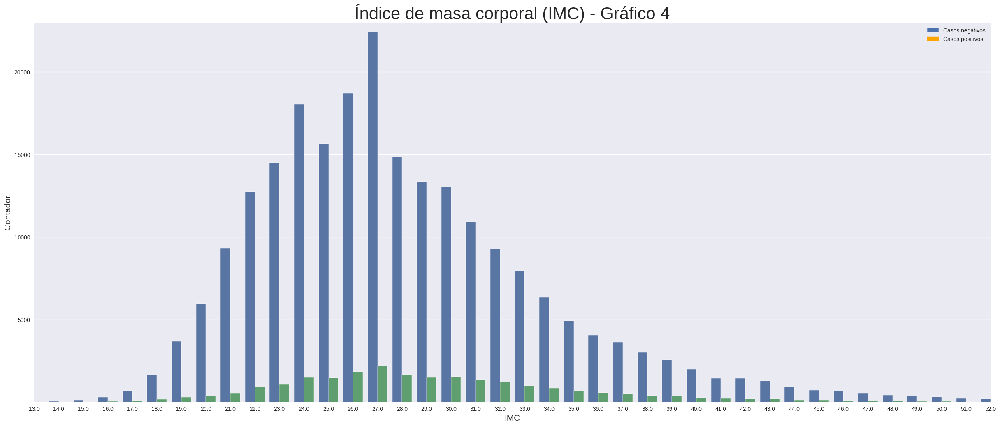

In [218]:
fig, ax = plt.subplots(figsize=(30,12))
plt.style.use("seaborn")
plt.subplots_adjust(hspace=0.2)
color = 'winter'
sns.countplot(x='IMC', data=df, hue='target', ax=ax)
plt.xlabel('IMC', fontsize = 15)
plt.ylabel('Contador', fontsize = 15)
plt.title("Índice de masa corporal (IMC) - Gráfico 4", fontsize=30)
patch_negativos = mpatches.Patch(label='Casos negativos')
patch_positivos = mpatches.Patch(color='orange', label='Casos positivos')
ax.legend(handles=[patch_negativos,patch_positivos])
ax.set_xlim(1, 40)
ax.set_ylim(1, 23000)
plt.show()

Se observó en el "Gráfico 4" una leve correlación entre el indice de masa corporal y la presencia de problemas en el corazón. En presencia y ausencia de problemas en el corazón se observo una distribución similar.

***
# Quinto análisis de datos
***

Text(12, 1, 'Correlación multivariable bajo umbral - Gráfico 5')

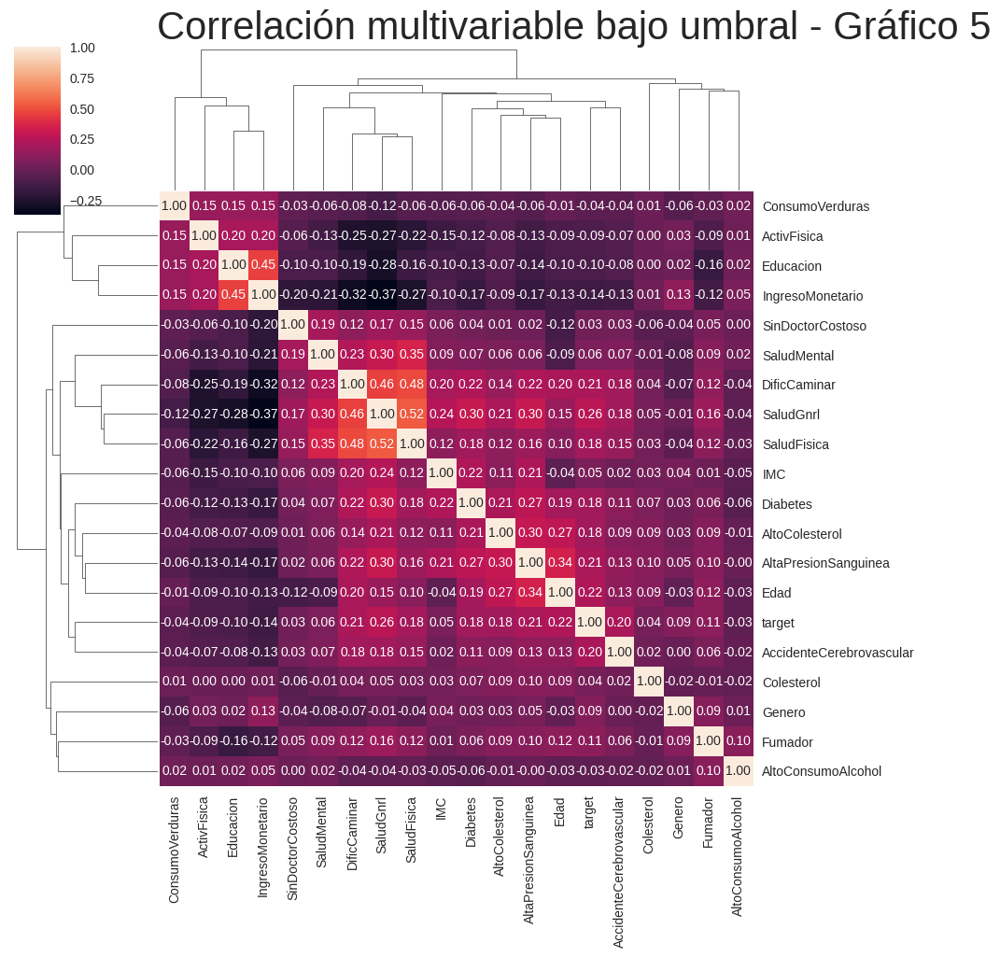

In [219]:
corr_matriz = df.corr()
umbral = 0.025
filtre = np.abs(corr_matriz["target"]) > umbral
corr_features = corr_matriz.columns[filtre].tolist()
sns.clustermap(df[corr_features].corr(), annot = True, fmt = ".2f")
plt.title("Correlación multivariable bajo umbral - Gráfico 5", fontsize=30, x=12, y=1)

Se observó en el "Gráfico 5" una matriz de relacion simétrica. Es por esta razón que solo se necesitó la parte superior a la diagonal principal para sacar algunas conclusiones.

Utilizando un umbral bajo (0.025) se observó que:

1-DificCaminar, (dificultades al caminar) tiene una correlación fuerte con SaludGnrl (salud general) 0.46 y PhysHlth (salud física) 0.48, asi como SaludGnrl con SaludFisica (salud fisica) 0.52.

2-IngresoMonetario parece ser poco util debido a que no tiene correlación con las demás características. Pudo ser una opción eliminarlo  del dataframe.

3-Nuestro target esta poco correlacionado con el IMC (índice de masa corporal) 0.05, SaludMental (0.06) y SinDoctorCostoso (0.03).

4-Nuestro target encontró una correlación negativa con IngresoMonetario (-0.14), Educacion (-0.1), ConsumoVerduras (-0.04) y ActivFisica (-0.09).



***
# Sexto análisis de datos
***

Text(12, 1, 'Correlación multivariable alto umbral - Gráfico 6')

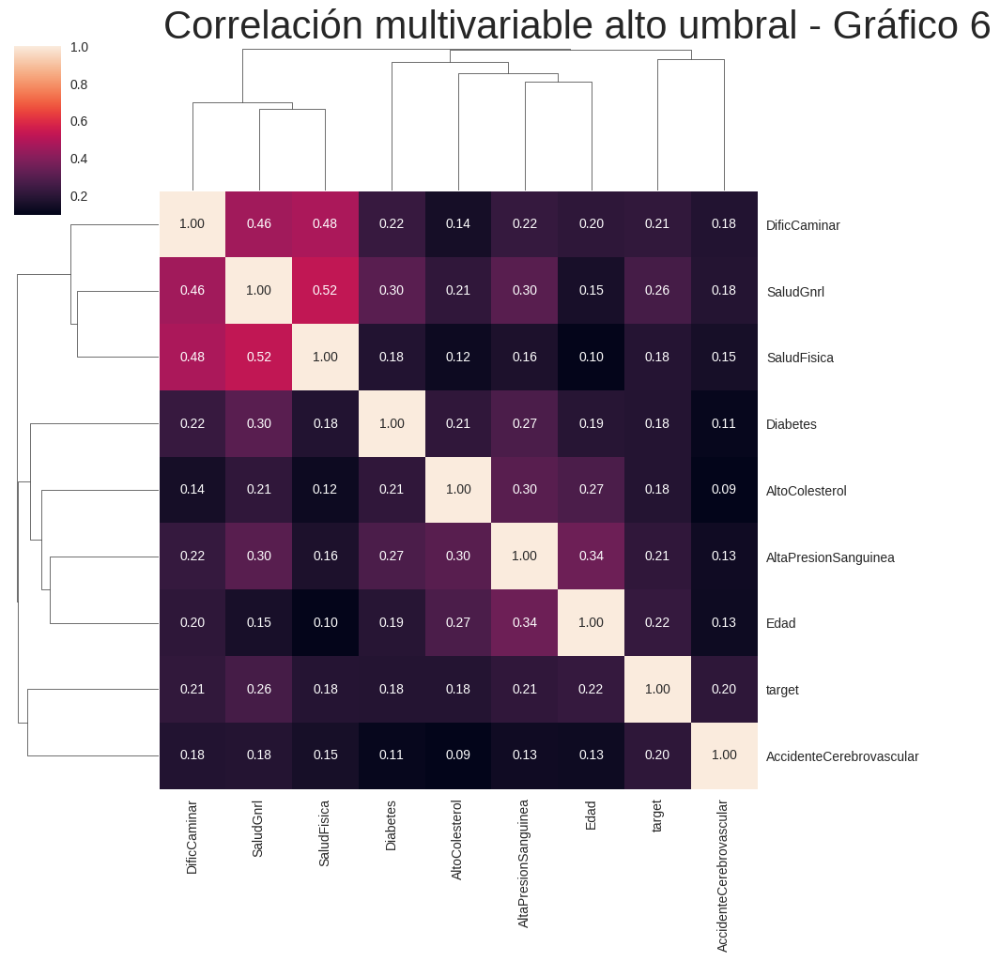

In [220]:
corr_matriz = df.corr()
umbral = 0.15
filtre = np.abs(corr_matriz["target"]) > umbral
corr_features = corr_matriz.columns[filtre].tolist()
sns.clustermap(df[corr_features].corr(), annot = True, fmt = ".2f")
plt.title("Correlación multivariable alto umbral - Gráfico 6", fontsize=30, x=12, y=1)

A partir del "Graficos 6" utilizando un umbral elevado (0.15) se pudo observar que:

5-La variable target esta mayormente correlacionada con SaludGnrl 0.26, DificCaminar 0.21, Edad 0.22 y AltaPresionSanguinea 0.21.

***
# Séptimo análisis de datos
***

In [221]:
fig = px.box(df, x="target", y="IMC", labels={'target':'Ocurrencia de ataques al corazón', 'IMC':'Indice de masa corporal'})
fig.update_layout(title="IMC para casos negativos y positivos de ataques al corazón - Gráfico 7")
fig.update_layout(title_font_size=30)
fig.show()

Al observar el "Gráfico 7" no fue posible encontrar algun tipo de patrón debido a la cantidad de datos extremos que se observan. No se pudieron observar diferencias significativas en cuanto al IMC para los casos negativos y positivos de ataques al corazón.
El IMC no es significativo en la ocurrencia de Ataques al Corazón respetando los insights obtenidos al observar el "Gráfico 5".





***
# Análisis de datos exploratorio
***

Características categóricas :
*   Género : Femenino > Masculino
*   Hipertensión: sin hipertensión > hipertensión
*   Ataques al corazón : sin enfermedad cardíaca > enfermedad cardíaca
*   Fumador : nunca ha fumado > anteriormente ha fumado > fumador

Características discretas (presencia de accidentes cerebrovasculares) :
*   Edad : 55 - 80
*   IMC : 20 - 40

In [222]:
with pd.option_context("display.max_columns", None):display(df)

,target,AltaPresionSanguinea,AltoColesterol,Colesterol,IMC,Fumador,AccidenteCerebrovascular,Diabetes,ActivFisica,ConsumoFrutas,ConsumoVerduras,AltoConsumoAlcohol,ObraSocial,SinDoctorCostoso,SaludGnrl,SaludMental,SaludFisica,DificCaminar,Genero,Edad,Educacion,IngresoMonetario
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,0.0,1.0,1.0,1.0,45.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,5.0,0.0,1.0,5.0,6.0,7.0
253676,0.0,1.0,1.0,1.0,18.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,0.0,0.0,1.0,0.0,11.0,2.0,4.0
253677,0.0,0.0,0.0,1.0,28.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,5.0,2.0
253678,0.0,1.0,0.0,1.0,23.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,1.0,7.0,5.0,1.0


In [223]:
num = ['IMC', 'Edad', 'SaludFisica', 'SaludMental']
df[num] = MinMaxScaler().fit_transform(df[num])
df.head()

,target,AltaPresionSanguinea,AltoColesterol,Colesterol,IMC,Fumador,AccidenteCerebrovascular,Diabetes,ActivFisica,ConsumoFrutas,...,ObraSocial,SinDoctorCostoso,SaludGnrl,SaludMental,SaludFisica,DificCaminar,Genero,Edad,Educacion,IngresoMonetario
0,0.0,1.0,1.0,1.0,0.325581,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,0.6,0.5,1.0,0.0,0.666667,4.0,3.0
1,0.0,0.0,0.0,0.0,0.151163,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.500000,6.0,1.0
2,0.0,1.0,1.0,1.0,0.186047,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,1.0,1.0,1.0,0.0,0.666667,4.0,8.0
3,0.0,1.0,0.0,1.0,0.174419,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.833333,3.0,6.0
4,0.0,1.0,1.0,1.0,0.139535,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.1,0.0,0.0,0.0,0.833333,5.0,4.0


Se decidió utilizaR Min-Max Scaler para normalizar los datos dentro del rango 0 a 1. De esta forma se pudo mejorar la precisión y el rendimiento de los modelos de aprendizaje automático teniendo en cuenta que utilizamos datos en diferentes escalas y unidades de medida.

In [224]:
X = df.drop("target", 1)       
Y = df['target']               
print("Matriz de características")
X

Matriz de características


<ipython-input-224-361259e12cd1>:1: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.



,AltaPresionSanguinea,AltoColesterol,Colesterol,IMC,Fumador,AccidenteCerebrovascular,Diabetes,ActivFisica,ConsumoFrutas,ConsumoVerduras,...,ObraSocial,SinDoctorCostoso,SaludGnrl,SaludMental,SaludFisica,DificCaminar,Genero,Edad,Educacion,IngresoMonetario
0,1.0,1.0,1.0,0.325581,1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,5.0,0.6,0.500000,1.0,0.0,0.666667,4.0,3.0
1,0.0,0.0,0.0,0.151163,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,3.0,0.0,0.000000,0.0,0.0,0.500000,6.0,1.0
2,1.0,1.0,1.0,0.186047,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,1.0,5.0,1.0,1.000000,1.0,0.0,0.666667,4.0,8.0
3,1.0,0.0,1.0,0.174419,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.000000,0.0,0.0,0.833333,3.0,6.0
4,1.0,1.0,1.0,0.139535,0.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,2.0,0.1,0.000000,0.0,0.0,0.833333,5.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,1.0,1.0,1.0,0.383721,0.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.166667,0.0,1.0,0.333333,6.0,7.0
253676,1.0,1.0,1.0,0.069767,0.0,0.0,2.0,0.0,0.0,0.0,...,1.0,0.0,4.0,0.0,0.000000,1.0,0.0,0.833333,2.0,4.0
253677,0.0,0.0,1.0,0.186047,0.0,0.0,0.0,1.0,1.0,0.0,...,1.0,0.0,1.0,0.0,0.000000,0.0,0.0,0.083333,5.0,2.0
253678,1.0,0.0,1.0,0.127907,0.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.000000,0.0,1.0,0.500000,5.0,1.0


In [225]:
print("Matriz de predicciones")
Y

Matriz de predicciones


0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
253675    0.0
253676    0.0
253677    0.0
253678    0.0
253679    1.0
Name: target, Length: 253680, dtype: float64

***
# Selección de características
***

**Forward Selection**

In [226]:
# Sequential Forward Selection(sfs)
sfs = SFS(LinearRegression(),
          k_features=11,
          forward=True,
          floating=False,
          scoring = 'r2',
          cv = 0)

Se utilizó la selección secuencial hacia acelante para obtener las características con mayor relevancia.

In [227]:
sfs.fit(X, Y)
sfs.k_feature_names_

('AltaPresionSanguinea',
 'AltoColesterol',
 'IMC',
 'Fumador',
 'AccidenteCerebrovascular',
 'Diabetes',
 'SaludGnrl',
 'SaludFisica',
 'DificCaminar',
 'Genero',
 'Edad')

**Bi-directional elimination (stepwise)**


In [228]:
def stepwise_selection(data, target,SL_in=0.05,SL_out = 0.05):
    initial_features = data.columns.tolist()
    best_features = []
    while (len(initial_features)>0):
        remaining_features = list(set(initial_features)-set(best_features))
        new_pval = pd.Series(index=remaining_features)
        for new_column in remaining_features:
            model = sm.OLS(target, sm.add_constant(data[best_features+[new_column]])).fit()
            new_pval[new_column] = model.pvalues[new_column]
        min_p_value = new_pval.min()
        if(min_p_value<SL_in):
            best_features.append(new_pval.idxmin())
            while(len(best_features)>0):
                best_features_with_constant = sm.add_constant(data[best_features])
                p_values = sm.OLS(target, best_features_with_constant).fit().pvalues[1:]
                max_p_value = p_values.max()
                if(max_p_value >= SL_out):
                    excluded_feature = p_values.idxmax()
                    best_features.remove(excluded_feature)
                else:
                    break 
        else:
            break
    return best_features

In [229]:
#stepwise_selection(X,Y)

También se utilizó la eliminación bi-direccional para elegir las mejores características. Esta no dió buenos resultados dado que seleccionó demasiadas características que en pasos anteriores se vió que no tenian relevancia en nuestro análisis. Por lo que se descartó este método.

In [230]:
X = df.drop(['target'], axis=1)
Y = df['target']

***
# Desbalanceo de dataset
***

Casos negativos: 229787
Casos positivos: 23893
Proporcionalidad: 9.62 : 1


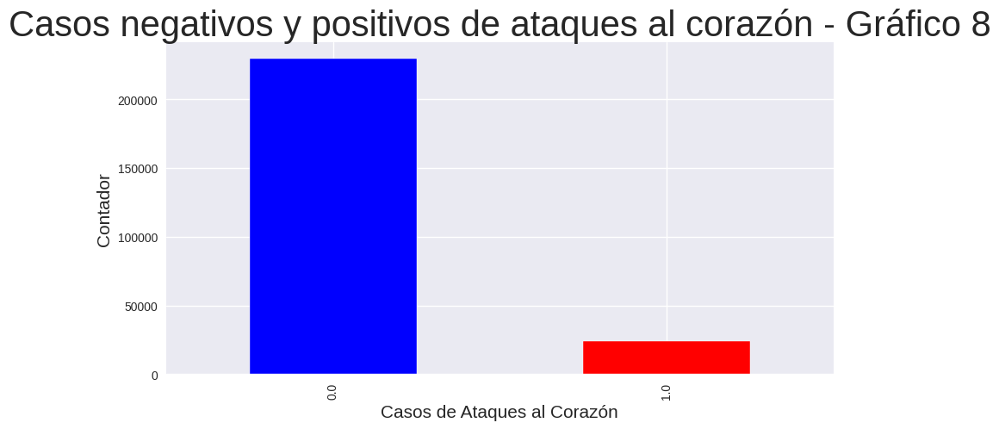

In [231]:
target_count = df.target.value_counts()
print('Casos negativos:', target_count[0])
print('Casos positivos:', target_count[1])
print('Proporcionalidad:', round(target_count[0] / target_count[1], 2), ': 1')
target_count.plot(kind='bar', figsize=(10,5), color=['blue','red']);
plt.xlabel('Casos de Ataques al Corazón', fontsize = 15)
plt.ylabel('Contador', fontsize = 15)
plt.title("Casos negativos y positivos de ataques al corazón - Gráfico 8", fontsize=30)
plt.show()

En el "Gráfico 8" se pudo observar un claro desbalanceo de clases.

**Oversampling - SMOTE (Synthetic Minority Oversampling TEchnique)**.

In [232]:
smote = SMOTE()
X_sm, y_sm = smote.fit_resample(X, Y)

In [233]:
# Se separó el entrenamiento/test en razon 90/10 %
X_train, X_test, y_train, y_test = train_test_split(X_sm,y_sm,test_size=0.1, random_state=1)

In [234]:
# Se creó un modelo Random Forest con parametros por defecto KNeighborsClassifier
modelo = RandomForestClassifier(random_state=1)
modelo.fit(X_train, y_train)
# Se obtuvieron las predicciones del modelo con X_test
preds = modelo.predict(X_test)
cf_matrix = confusion_matrix(y_test, modelo.predict(X_test))

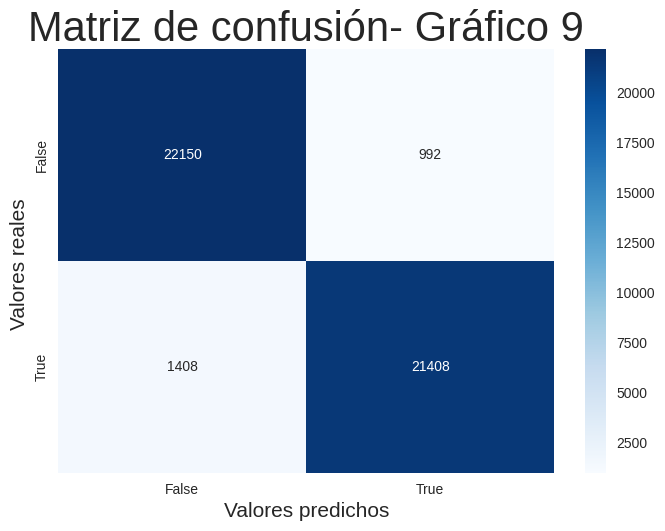

In [235]:
ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues', fmt = ".0f")
ax.set_title('Matriz de confusión- Gráfico 9', fontsize = 30);
ax.set_xlabel('Valores predichos', fontsize = 15)
ax.set_ylabel('Valores reales ', fontsize = 15)
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])
plt.show()

La matriz expuesta en el "Gráfico 9" se utilizó para evaluar la precisión de un clasificador.

In [236]:
confusion = metrics.confusion_matrix(y_test, preds)
confusion.ravel()

array([22150,   992,  1408, 21408])

In [237]:
accuracy = metrics.accuracy_score(y_test, preds)
accuracy 

0.9477784063710344

Se pudo observar como se clasifican correctamente el 94.7% de los datos.

In [238]:
# Precision se evalua para cada categoria
precision_positiva = metrics.precision_score(y_test, preds, pos_label=1)
precision_negativa = metrics.precision_score(y_test, preds, pos_label=0)
precision_positiva, precision_negativa

(0.9557142857142857, 0.9402326173698956)

In [239]:
recall_sensibilidad = metrics.recall_score(y_test, preds, pos_label=1)
recall_especificidad= metrics.recall_score(y_test, preds, pos_label=0)
recall_sensibilidad, recall_especificidad

(0.938288920056101, 0.9571342148474635)

In [240]:
f1_positivo = metrics.f1_score(y_test, preds, pos_label=1)
f1_negativo = metrics.f1_score(y_test, preds, pos_label=0)
f1_positivo, f1_negativo

(0.9469214437367304, 0.9486081370449679)

Teniendo en cuenta los casos negativos se encontró:
  *   Alta precisión
  *   Alto recall

Teniendo en cuenta los casos positivos se encontró:
  *   Alta precisión
  *   Alto recall

Por lo tanto el modelo logró clasificar las clases correctamente.

In [241]:
print(metrics.classification_report(y_test, preds))

              precision    recall  f1-score   support

         0.0       0.94      0.96      0.95     23142
         1.0       0.96      0.94      0.95     22816

    accuracy                           0.95     45958
   macro avg       0.95      0.95      0.95     45958
weighted avg       0.95      0.95      0.95     45958



Se observó mediante el cuadro superior que el modelo detectó correctamente los casos positivos y negativos de ataques al corazón. Se solucionó el desbalanceo del dataset elegido.


***
# StoryTelling
***

Constantemente estamos presenciando noticias en donde se anuncian muertes rápidas y que parecen no tener ninguna causa. Según la Organización Mundial de la Salud (OMS), el accidente cerebrovascular es la 2ª causa principal de muerte a nivel mundial, responsable de aproximadamente el 11% del total de muertes. Más de 877,500 estadounidenses mueren de enfermedades cardíacas, accidentes cerebrovasculares y otras enfermedades cardiovasculares cada año.


Quienes sufren de estas enfermedades pueden ser nuestras parejas, padres, abuelos, amigos o incluso conocidos.

Se sabe que entre los diferentes géneros tenemos nuestras difrencias, ya sean fisicas como psicológicas. Entonces, ¿se puede observar alguna diferencia en cuanto al género?


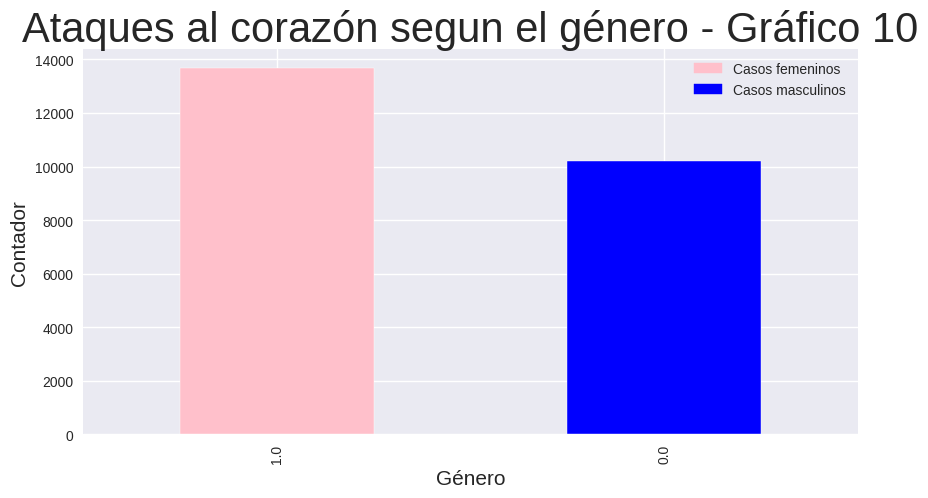

In [242]:
ax = df_positivos['Genero'].value_counts().plot(kind='bar', figsize=(10,5), color=['pink','blue'])
plt.title("Ataques al corazón segun el género - Gráfico 10", fontsize=30)
ax.set_xlabel("Género", fontsize = 15)
ax.set_ylabel("Contador", fontsize = 15)
pink_patch = mpatches.Patch(color='pink', label='Casos femeninos')
blue_patch = mpatches.Patch(color='blue', label='Casos masculinos')
ax.legend(handles=[pink_patch,blue_patch])
Genero_count = df_positivos.Genero.value_counts()

Como se pudo observar en el "Gráfico 10" aproximádamente el 58% de los casos es femenino y el 42% masculino. Por lo que no se pudo ver inferencia del género al presentar problemas al corazón.

Entonces se presentó la pregunta, ¿las personas con mayor poder adquisitivo estan exentos de los problemas al corazón?


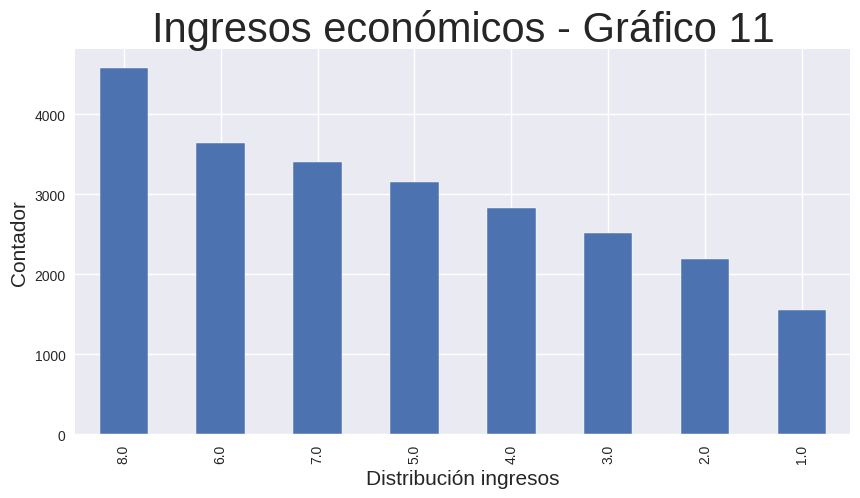

In [243]:
ax = df_positivos['IngresoMonetario'].value_counts().plot(kind='bar',figsize=(10,5))
plt.title("Ingresos económicos - Gráfico 11", fontsize=30)
ax.set_xlabel("Distribución ingresos", fontsize = 15)
ax.set_ylabel("Contador", fontsize = 15)
Income_count = df_positivos.IngresoMonetario.value_counts()

Al observar el "Gráfico 11" se puede llegar a concluir que seamos personas adineradas o no, nada nos exenta de sufrir problemas al corazón. Por otra parte se debe tener en cuenta que aquellas personas con mayores ingresos tienen mas acceso a instituciones de salud y son mas propensas a testearse.

Otra pregunta que surgió fue: ¿Es posible identificar una mejora en las personas que presentan una buena alimentacion y una buena condición física?

<ipython-input-244-445192a87bc4>:2: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



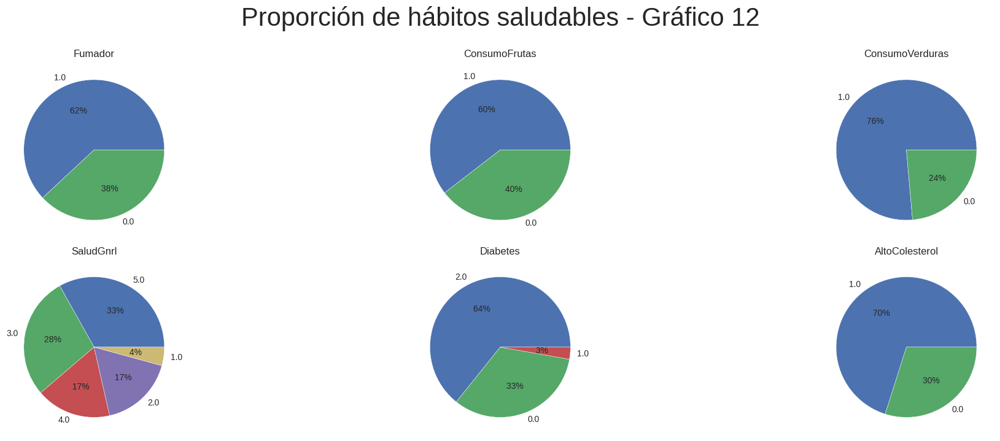

In [244]:
plt.figure(figsize=(20,20))
plt.style.use("seaborn")
plt.subplots_adjust(hspace=0.2)
color = 'sienna'
list1 = ["Fumador","ConsumoFrutas","ConsumoVerduras","SaludGnrl","Diabetes","AltoColesterol"]
for i,column in enumerate(list1):
    plt.subplot(len(list1), 3, i+1)
    plt.suptitle("Proporción de hábitos saludables - Gráfico 12", fontsize=30, x=0.5, y=1)
    plt.pie(x=df_positivos[column].value_counts(), labels=df_positivos[column].unique(), autopct=' %.0f%% ')
    plt.title(f"{column}")
    plt.tight_layout()

A primer vista se pudo concluir que la presencia de un buen estado de salud afecta a la presencia de ataques al corazón. Por otro lado se debe saber que aquellas personas que sufrieron de algún ataque o han sido diagnosticadas con esta enfermedad comenzaron a cuidar su salud para evitar tener problemas mayores. Es por eso que se vieron estos datos.

Salud general = ( 0.33   ×   5 )   +   ( 0.28   ×   3 )   +   ( 0.17   ×   4 )   +   ( 0.17   ×   2 )   +   ( 0.04   ×   1 ) = 3.55

En datos se observó que:

*   El 62% fueron fumadores
*   El 60% consumian frutas
*   El 76% consumian frutas
*   El 67% tenia diabetes
*   El 70% tenia alto colesterol



<ipython-input-245-9922f766df89>:2: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



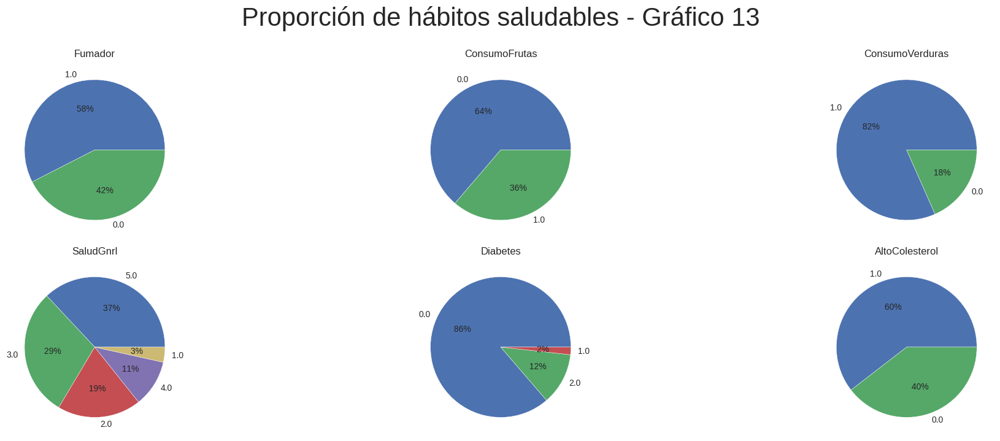

In [245]:
plt.figure(figsize=(20,20))
plt.style.use("seaborn")
plt.subplots_adjust(hspace=0.2)
color = 'sienna'
list1 = ["Fumador","ConsumoFrutas","ConsumoVerduras","SaludGnrl","Diabetes","AltoColesterol"]
for i,column in enumerate(list1):
    plt.subplot(len(list1), 3, i+1)
    plt.suptitle("Proporción de hábitos saludables - Gráfico 13", fontsize=30, x=0.5, y=1)
    plt.pie(x=df_negativos[column].value_counts(), labels=df_negativos[column].unique(), autopct=' %.0f%% ')
    plt.title(f"{column}")
    plt.tight_layout()

Salud general = ( 0.37   ×   5 )   +   ( 0.29   ×   3 )   +   ( 0.19   ×   2 )   +   ( 0.11   ×   4 )   +   ( 0.03   ×   1 ) = 3.57

Este grupo presentó:
*   Presencia de fumadores 
*   Consumo reducido de frutas
*   Reducida presencia de diabetes
*   Alto nivel de colesterol
Aunque por otro lado presenta:
*   Consumo elevado de verduras
*   Similar salud general al grupo que presentaba ataques al corazón.

En datos se observó que:
*   El 58% fueron fumadores
*   El 64% consumian frutas
*   El 82% consumian frutas
*   El 88% tenia diabetes
*   El 60% tenia alto colesterol





Muchas estrategias de prevención de accidentes cerebrovasculares son las mismas que las estrategias de prevención de enfermedades cardíacas. Controlar la presión arterial alta, reducir la cantidad de colesterol y grasas saturadas en tu alimentación, hacer ejercicio de forma regular, evitar el alcohol y el tabaquismo entre otras recomendaciones para mantener un estilo de vida saludable. Es escencial la detección temprana de los distintos signos de advertencia para evitar o minimizar un accidente cerebrovascular. La solución esta en nuestras menos y no se requiere de una inversión elevada mas que el cuidado de uno mismo.


El momento de actuar es hoy.

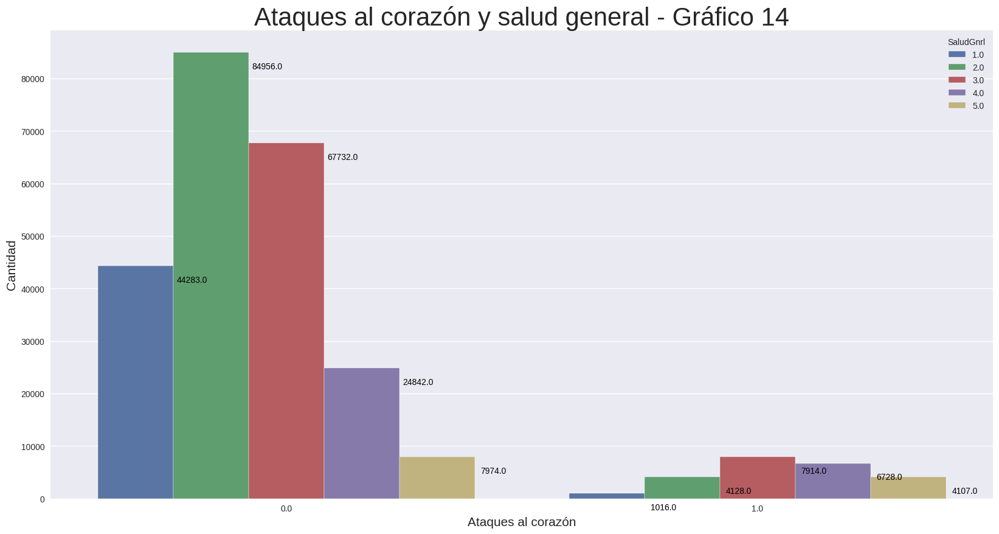

In [246]:
fig, ax=plt.subplots(figsize=(20,10)) 
sns.countplot(x=df.target,hue=df.SaludGnrl)
for p in ax.patches:
    ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.2, p.get_height()), ha='center', va='top', color='black', size=10)
plt.title('Ataques al corazón y salud general - Gráfico 14', fontsize='30')
plt.xlabel('Ataques al corazón', fontsize=15)
plt.ylabel('Cantidad', fontsize=15)
plt.show() 

En el "Gráfico 14" se pudo observar que aquellas personas que:
 
*   No sufrieron de un ataque al corazón
      *   85.7% tiene al menos un estado de salud general bueno
*   Sufrieron de un ataque al corazón
      *   54.6% tiene al menos un estado de salud general bueno

Claramente se puede ver un aumento del 30% del estado de salud general bueno en los casos en donde no surfieron de ningún un ataque al corazón.

In [247]:
fig = px.histogram(df, x='SaludMental', y='Edad', color='Genero', title='Salud Mental segun Edad, divido por Sexo - Gráfico 15', range_x=[0.08, 0.98], range_y=[0, 5000],
             labels={'SaludMental':'Estado de Salud Mental', 'Edad':'Division de edad'})
fig.update_layout(width=1150, height=600)
fig.show()

Se observó en el "Gráfico 15" que aquellas personas con poca salud mental suelen ser jovenes y en su mayoría de género femenino.

In [248]:
fig = px.box(df, x="target", y="Edad", labels={'target':'Ataques al corazón', 'Edad':'División de edad'},
             title = "Edad y ocurrencia de ataques al corazón - Gráfico 16")
fig.update_layout(width=1150, height=600)
fig.show()

Al observar el "Gráfico 16" se pudo concluir que la mediana de los casos positivos fueron mayores a los correspondientes con los casos negativos. Es decir que aquellas personas de edad avanzada tendieron a ser mas suceptibles a sufrir ataques al corazón. Ademas se presentaron algunos casos extremos en los positivos, pero ninguno en los casos negativos.

<ipython-input-249-87def1786900>:3: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



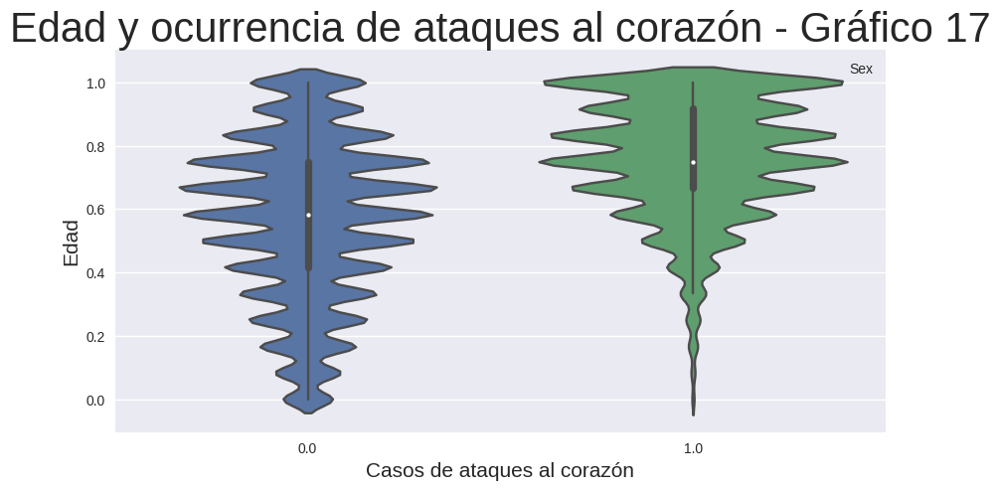

In [249]:
ax = plt.rcParams['figure.figsize'] = (10, 5)
sns.violinplot(df, x="target", y="Edad")
plt.style.use("seaborn")
plt.subplots_adjust(hspace=0.2)
color = 'sienna'
plt.xlabel('Casos de ataques al corazón', fontsize = 15)
plt.ylabel('Edad', fontsize = 15)
plt.title('Edad y ocurrencia de ataques al corazón - Gráfico 17', fontsize = 30)
plt.legend(title="Sex")
plt.show()

En el "Gráfico 17" se pudo obervar que los casos positivos de Ataques al corazón se dieron en mayor medida en personas de edad avanzada.

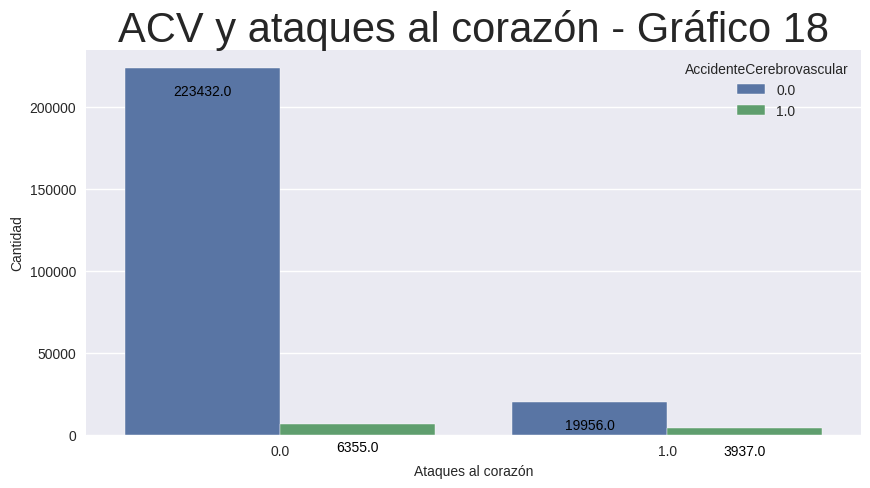

In [250]:
fig, ax=plt.subplots(figsize=(10,5)) 
sns.countplot(x=df.target,hue=df.AccidenteCerebrovascular)
for p in ax.patches:
    ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.2, p.get_height()), ha='center', va='top', color='black', size=10)
plt.title('ACV y ataques al corazón - Gráfico 18', fontsize='30')
plt.xlabel('Ataques al corazón', fontsize=10)
plt.ylabel('Cantidad', fontsize=10)
plt.show() 

En el "Gráfico 18" se pudo observar que aquellas personas que:

*   No sufrieron de un ataque al corazón
      *   97.2% no sufrió de un ACV
      *   2.8% sufrió de un ACV
*   Sufrieron de un ataque al corazón
      *   80.3% no sufrió de un ACV
      *   19.7% sufrió de un ACV

Claramente se puede ver un aumento de casi 10 veces mas de casos de ACV en personas que sufrieron previamente un ataque al corazón.



In [251]:
corr_coef = np.corrcoef(df['target'], df['AccidenteCerebrovascular'])[0, 1]
print(corr_coef)

0.20300193999028787


Se pudo observar que el coeficiente de correlación de Phi es de aproximadamente 0.2 indicando una correlación leve pero de importancia.

Text(0.5, 0, 'Características')

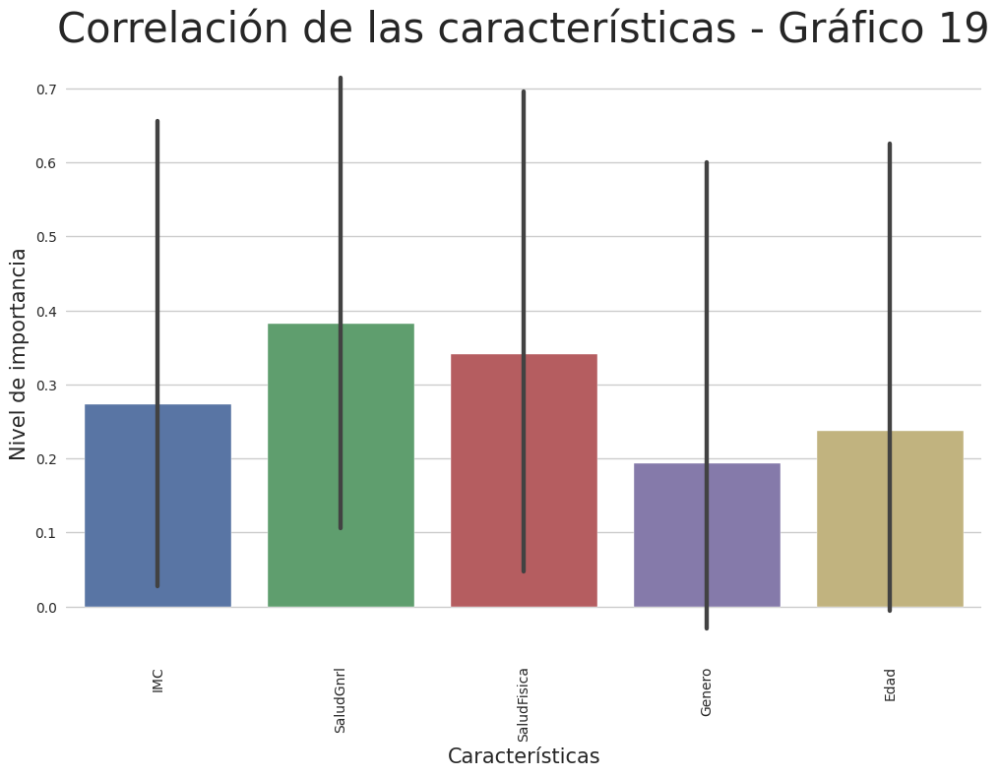

In [252]:
df_auxiliar = df.drop(['Colesterol','ActivFisica','ConsumoFrutas','ConsumoVerduras', 'AltoConsumoAlcohol', 'ObraSocial','SinDoctorCostoso', 'SaludMental', 'Educacion', 'IngresoMonetario', 'target',
                       'AltaPresionSanguinea','AltoColesterol','Fumador', 'AccidenteCerebrovascular', 'Diabetes', 'DificCaminar'], axis=1)

sns.set_style('whitegrid')
df_auxiliar = df_auxiliar.corr()
plt.figure(figsize = (12,8))
plt.xticks(rotation = 90)
ax = sns.barplot(data = df_auxiliar);
ax.set_title('Correlación de las características - Gráfico 19', fontsize=30)
ax.set_ylabel('Nivel de importancia', fontsize=15)
ax.set_xlabel('Características', fontsize=15)

En el "Gráfico 19" se pudo observar la correlación entre las variables más importantes para la determinación de nuestro target. Se pudo notar que todas superan el valor de 0.19 indicando una buena correlación entre las mismas.

***
# Probando distintos modelos
***

LogisticRegression:
	Accuracy: 0.7823012315592498
	Precision: 0.7832410808951413
	Recall: 0.7823012315592498
	F1 Score: 0.7821792041934823


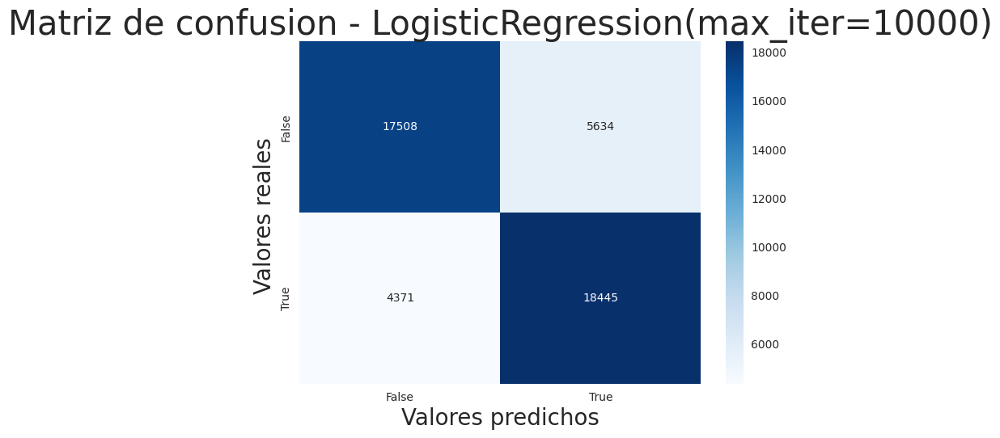

<Figure size 1000x500 with 0 Axes>

KNeighborsClassifier:
	Accuracy: 0.8826537273162453
	Precision: 0.891899869882178
	Recall: 0.8826537273162453
	F1 Score: 0.8820302002673039


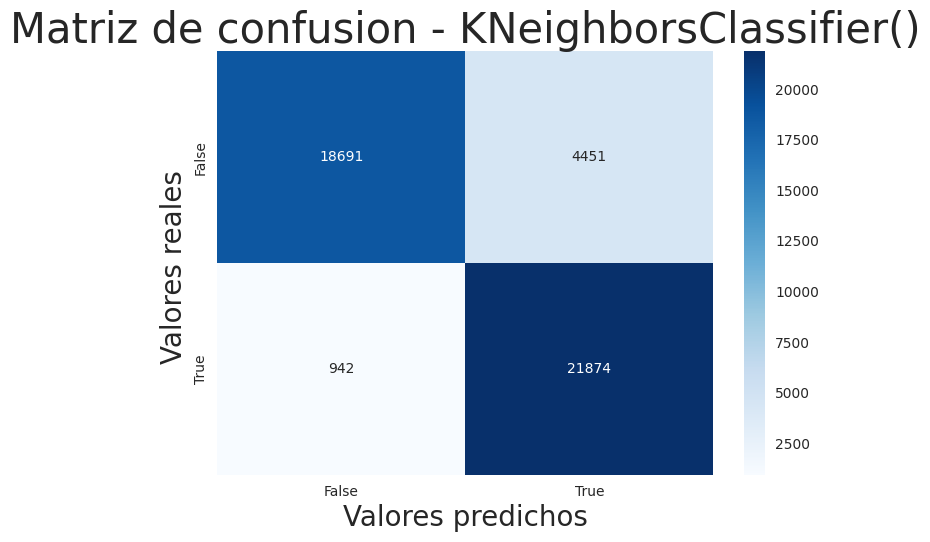

<Figure size 1000x500 with 0 Axes>

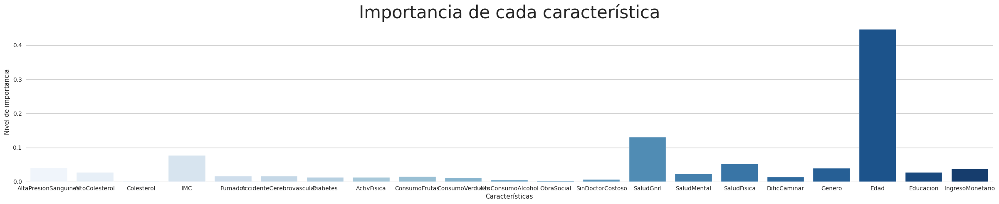

DecisionTreeClassifier:
	Accuracy: 0.9123112406980286
	Precision: 0.9124198455951659
	Recall: 0.9123112406980286
	F1 Score: 0.9123107973006498


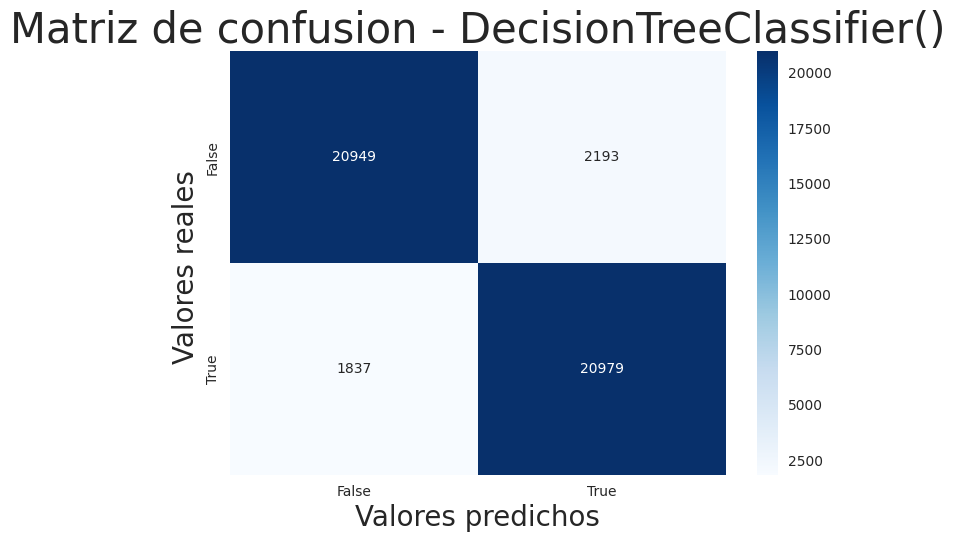

<Figure size 1000x500 with 0 Axes>

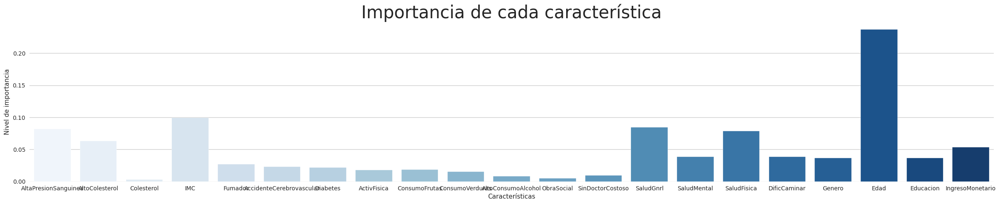

RandomForestClassifier:
	Accuracy: 0.9480177553418339
	Precision: 0.9481628767076107
	Recall: 0.9480177553418339
	F1 Score: 0.9480099557775855


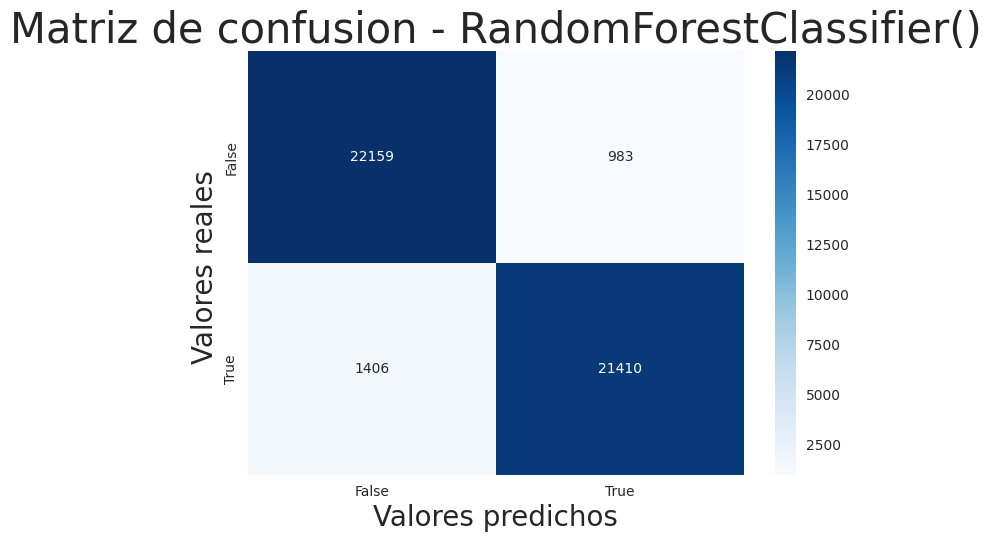

<Figure size 1000x500 with 0 Axes>

In [253]:
X_train, X_test, y_train, y_test = train_test_split(X_sm,y_sm,test_size=0.1, random_state=1)

models = [
    # Se incrementó la cantidad máxima de iteraciones dado que no convergia
    # a la solución con la cantidad predeterminada de máximas iteraciones
    LogisticRegression(max_iter=10000), 
    KNeighborsClassifier(),
    DecisionTreeClassifier(),
    RandomForestClassifier()
]

for model in models:

    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    cf_matrix= confusion_matrix(y_test, y_pred)

    if not isinstance(model, LogisticRegression) and not isinstance(model, KNeighborsClassifier):
        plt.figure(figsize=(30,5))
        importances = model.feature_importances_
        columns = X_sm.columns
        ax = sns.barplot(x=columns, y=importances, palette="Blues")
        ax.set_xlabel("Características")
        ax.set_ylabel("Nivel de importancia")
        plt.title('Importancia de cada característica', fontsize = 30)
        print(f"\n")
        plt.show()

    print(f"{type(model).__name__}:")
    print(f"\tAccuracy: {accuracy}")
    print(f"\tPrecision: {precision}")
    print(f"\tRecall: {recall}")
    print(f"\tF1 Score: {f1}")

    ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues', fmt = ".0f")
    ax.set_title(f"Matriz de confusion - {model}", fontsize = 30);
    ax.set_xlabel('Valores predichos', fontsize = 20)
    ax.set_ylabel('Valores reales ', fontsize = 20)
    ax.xaxis.set_ticklabels(['False','True'])
    ax.yaxis.set_ticklabels(['False','True'])
    plt.figure(figsize=(10,5))
    plt.show()

Para resumir se puede decir que luego de modelar utilizando distintos modelos, la **clasificación por bosque aleatorio** dió los mejores resultados. Estos modelos se ejecutaron con los valores predeterminados de sus parametros. Se truncó a dos dígitos para una facil lectura.

*   Regresión logística:

	    Accuracy: 0.783

	    Precision: 0.784

	    Recall: 0.783

	    F1 Score: 0.783

*   Clasificador de vecinos más cercanos (K-Neighbors):

	    Accuracy: 0.881

	    Precision: 0.891

	    Recall: 0.881

	    F1 Score: 0.880


*   Clasificador de árbol de decisión:

	    Accuracy: 0.913

	    Precision: 0.913

	    Recall: 0.913

	    F1 Score: 0.913

*   Clasificador de bosque aleatorio:

	    Accuracy: 0.947

	    Precision: 0.947

	    Recall: 0.947

	    F1 Score: 0.947
